In [ ]:
from igraph import *
import json
import random
import numpy as np
from numpy import linalg 
import networkx as nx
import itertools
import matplotlib.pyplot as plt
from scipy.spatial import Delaunay
import os
import pandas as pd
from copy import deepcopy
from numpy.linalg import norm

In [ ]:
random.seed(2022)
np.random.seed(2022)

In [ ]:
uber_data  = pd.read_csv('./los_angeles-censustracts-2019-4-All-MonthlyAggregate.csv')

df = uber_data[uber_data['month']==12][['sourceid','dstid','mean_travel_time']]
data = df.values

In [ ]:
with open('los_angeles_censustracts.json') as f:
    census_tracts = json.loads(f.readline())

In [ ]:
census_tracts['features'][0]['properties']

{'MOVEMENT_ID': '1', 'TRACT': '480302', 'DISPLAY_NAME': 'Census Tract 480302'}

In [ ]:
np.array(census_tracts['features'][0]['geometry']['coordinates'][0]).mean(axis=0)  # [longitude, latitude]

array([-118.12053321,   34.10309557])

In [ ]:
display_names = dict()
coordinates = dict()

for area in census_tracts['features']:
    id = int(area['properties']['MOVEMENT_ID'])
    display_name = area['properties']['DISPLAY_NAME']
    display_names[id] = display_name
    a = area['geometry']['coordinates'][0]
    coordinates[id] = np.array(a if type(a[0][0]) == float else a[0]).mean(axis=0)

In [ ]:
for i in range(5):
    key = i + 1
    print('{}: {}, {}'.format(key, display_names[key], coordinates[key]))

1: Census Tract 480302, [-118.12053321   34.10309557]
2: Census Tract 480303, [-118.13785063   34.09645121]
3: Census Tract 480304, [-118.13138209   34.09626386]
4: Census Tract 480400, [-118.13224544   34.10349303]
5: Census Tract 480500, [-118.14492317   34.0986815 ]


In [ ]:
# Creating undirected graph with just node and node properties

g = Graph(directed=False)
g.add_vertices(len(display_names))
g.vs['display_name'] = list(display_names.values())
g.vs['coordinates'] = list(coordinates.values())

In [ ]:
month_filter = {12}  # for monthly aggregate data of 4th quarter, we can filter data based off of only December

edges = []
weights = []

with open('los_angeles-censustracts-2019-4-All-MonthlyAggregate.csv') as f:
    f.readline()  # skip the first line since it's the headers.
    
    while True:
        line = f.readline()
        if line == '':
            break  # end of file
        
        vals = line.strip().split(',')
        
        # read edge info
        src, dest, month, dist = int(vals[0]), int(vals[1]), int(vals[2]), float(vals[3])
        
        # if data is not relevant, skip it
        if month not in month_filter:
            continue
            
        edges.append((src - 1, dest - 1))
        weights.append(dist)

In [ ]:
g.add_edges(edges)
g.es['weight'] = weights
del edges, weights

In [ ]:
print(len(g.vs), len(g.es))

2716 1692450


In [ ]:
# keep only the giant connected component
components = g.components()
gcc = max(components, key=len)
vs_to_delete = [i for i in range(len(g.vs)) if i not in gcc]
g.delete_vertices(vs_to_delete)

# remove duplicate edges
g = g.simplify(combine_edges=dict(weight='mean'))  # combine duplicate edges

In [ ]:
copy_g = deepcopy(g)

In [ ]:
print(len(g.vs), len(g.es))

2649 1003858


In [ ]:
mst = g.spanning_tree(weights=g.es['weight'])

In [ ]:
mst_cost = sum(mst.es['weight'])

In [ ]:
edf = mst.get_edge_dataframe()
edf.head()

,source,target,weight
edge ID,,,
0,0,2,129.765
1,0,13,118.335
2,1,2,90.235
3,1,3,126.475
4,1,9,125.675


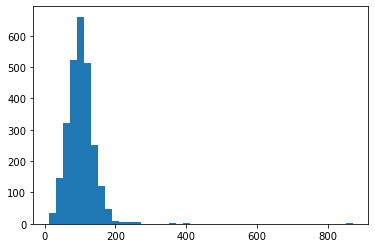

In [ ]:
import matplotlib.pyplot as plt
weights = mst.es['weight']
binwidth = 20
bins = np.arange(min(weights), max(weights) + binwidth, binwidth)
plt.hist(weights, bins=bins)
plt.show()

In [ ]:
for i, e in enumerate(mst.es):
    print('Distance in miles: {:.3f}\nTime taken: {:.1f}\n---------\n'.format(linalg.norm(mst.vs[e.source]['coordinates'] - mst.vs[e.target]['coordinates'])* 69, e['weight']))
    if i > 10:
        break

Distance in miles: 0.885
Time taken: 129.8
---------

Distance in miles: 0.570
Time taken: 118.3
---------

Distance in miles: 0.447
Time taken: 90.2
---------

Distance in miles: 0.621
Time taken: 126.5
---------

Distance in miles: 0.812
Time taken: 125.7
---------

Distance in miles: 0.618
Time taken: 119.9
---------

Distance in miles: 0.936
Time taken: 125.2
---------

Distance in miles: 0.412
Time taken: 91.8
---------

Distance in miles: 0.256
Time taken: 60.9
---------

Distance in miles: 0.204
Time taken: 87.1
---------

Distance in miles: 0.620
Time taken: 110.9
---------

Distance in miles: 0.493
Time taken: 162.3
---------



### Question 11

In [ ]:
def is_triangle(sides):
    (l, w, h) = (sides[0], sides[1], sides[2])
    if l + w > h and l + h > w and h + w > l:
        return True
    else:
        return False


def sample_triangles(g, n_samples):
    count = 0
    result = list()
    while len(result) < n_samples:
        try:
            points = np.random.randint(1, high=len(g.vs), size=3)
            (e1, e2, e3) = (g.get_eid(points[0], points[1]),
                            g.get_eid(points[1], points[2]),
                            g.get_eid(points[2], points[0]))
            weights = [g.es['weight'][e1], g.es['weight'][e2],
                       g.es['weight'][e3]]
            result.append(weights)
        except:
            continue

    # result will have tuple of the the vertices of a triangle

    return result

In [ ]:
result = sample_triangles(g,1000)

In [ ]:
counter = 0 
for weight in result:
    if is_triangle(weight):
        counter+=1
print(counter/len(result))

0.91


### Question 12

In [ ]:
arr = data
for i in range(0,len(arr)):
    if(arr[i][0]>arr[i][1]):
        t = arr[i][0]
        arr[i][0] = arr[i][1]
        arr[i][1] = t
newdf = pd.DataFrame(arr)
arr1 = newdf.groupby([0,1]).mean().reset_index()
arr1 = arr1.rename(columns={0: "source", 1: "sink", 2: "weight"})

g = nx.from_pandas_edgelist(arr1, 'source','sink', ['weight'])
gcc = g.subgraph(max(nx.connected_components(g), key=len))
mst = nx.minimum_spanning_tree(gcc)
mg = nx.MultiGraph()

In [ ]:
# mst_cost = sum(mst.edges['weight'])
for i in mst.edges:
    w = mst.edges[i[0],i[1]]['weight']
    mg.add_edge(i[0],i[1],weight=w)
    mg.add_edge(i[0],i[1],weight=w)


vertices, count = [], 0
for i in mg.nodes:
    vertices.append(i)
    count += 1
    if count>60: 
        break

In [ ]:
costs, current_paths = [], []
for vertex in vertices:
    tour = [u for u,v in nx.eulerian_circuit(mg,source=vertex)]
    path , visited_nodes = [], set()
    for i in tour:
        if i not in visited_nodes: 
            path.append(i) 
            visited_nodes.add(i) 
    path.append(path[0])
    current_paths.append(path)
    tsp_cost = 0
    for i in range(len(path)-1):
        s,t = path[i], path[i+1]
        w = 0
        if mst.has_edge(s,t): 
            w = mst.edges[s,t]['weight']
        else: 
            w = nx.dijkstra_path_length(gcc,s,t)
        tsp_cost += w
    costs.append(tsp_cost)

min_tsp_cost = min(costs)
trajectory = current_paths[np.argmin(costs)]

In [ ]:
print('MST cost:',round(mst_cost))
print('TSP cost:',round(min_tsp_cost))
print('Ratio:',round(min_tsp_cost/mst_cost,2))

MST cost: 269085
TSP cost: 421489
Ratio: 1.57


### Question 13

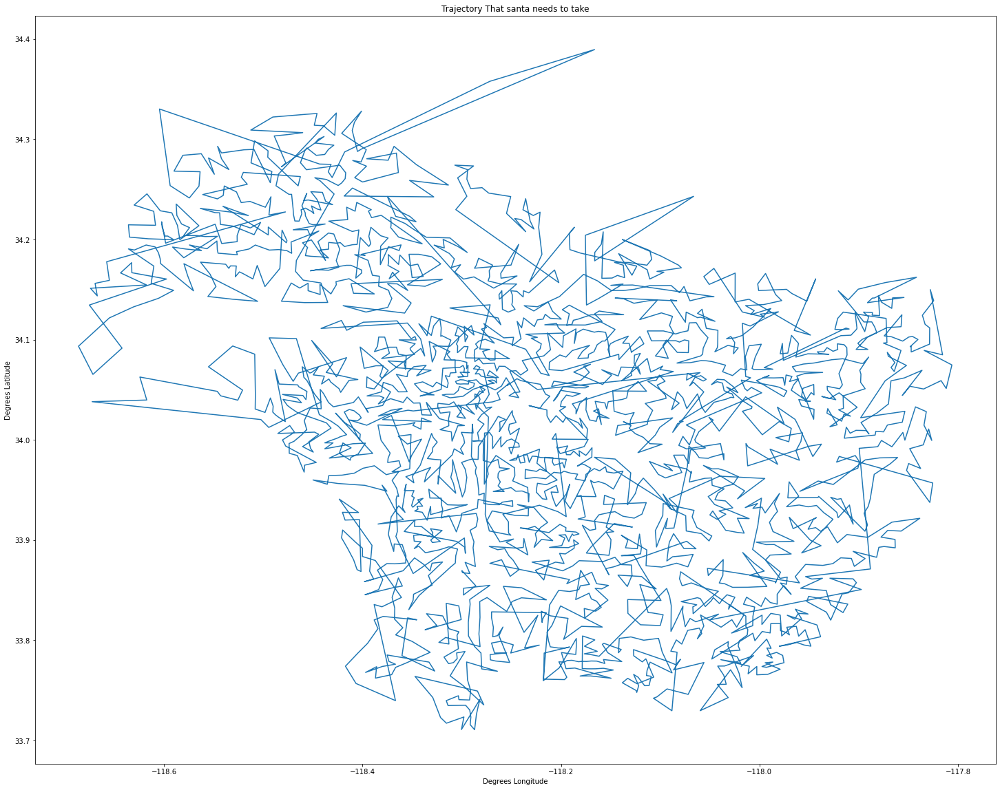

In [ ]:
latitude = []
longitude = []

for i in trajectory:
    latitude.append(coordinates[int(i)][1])
    longitude.append(coordinates[int(i)][0])

plt.figure(figsize=(25,20))

plt.plot(longitude, latitude,'-')
plt.title('Trajectory That santa needs to take')
plt.xlabel('Degrees Longitude')
plt.ylabel('Degrees Latitude')
plt.savefig('Q13.png',dpi=500,bbox_inches='tight')
plt.show()


### Question 14

In [ ]:
vertices_dict = {}
for vertex in copy_g.vs():
    key = str(vertex['coordinates'][1]) + "-" + str(vertex['coordinates'][0])
    vertices_dict[key] = 1

In [ ]:
lat_long = {}

with open('./los_angeles_censustracts.json', 'r') as f:
    cur_data = json.loads(f.readline())
    features = cur_data['features']
    for feature in features:
        latitude = 0.0
        longitude = 0.0
        if feature['geometry']['type']=='Polygon':
            coordi = np.array(feature['geometry']['coordinates'][0])
            for coordinate in coordi:
                latitude += coordinate[1]
                longitude += coordinate[0]
        if feature['geometry']['type']=='MultiPolygon':
            coordi = np.array(feature['geometry']['coordinates'][0][0])
            for coordinate in coordi:
                latitude += coordinate[1]
                longitude += coordinate[0]
        latitude /= len(coordi)
        longitude /= len(coordi)
        
        lat_long[feature['properties']['MOVEMENT_ID']] = (feature['properties']['DISPLAY_NAME'], latitude, longitude)
#         a = feature['geometry']['coordinates'][0]
#         co = np.array(a if type(a[0][0]) == float else a[0]).mean(axis=0)
#         key = str(co[1]) + "-" + str(co[0])
        
#         if(key in vertices_dict):
#             lat_long[feature['properties']['MOVEMENT_ID']] = (feature['properties']['DISPLAY_NAME'], latitude, longitude)

f.close()

In [ ]:
display_names = dict()
coordinates = dict()

for area in census_tracts['features']:
    id = int(area['properties']['MOVEMENT_ID'])
    display_name = area['properties']['DISPLAY_NAME']
    display_names[id] = display_name
    a = area['geometry']['coordinates'][0]
    coordinates[id] = np.array(a if type(a[0][0]) == float else a[0]).mean(axis=0)

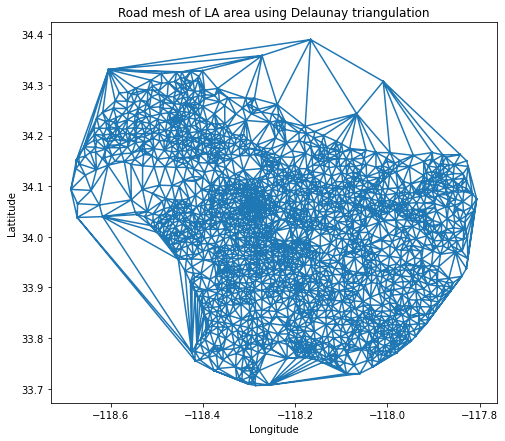

In [ ]:
lat=[]
lon=[]
display_names = []
for key in list(lat_long.keys()):
    lat.append(lat_long[key][1])
    lon.append(lat_long[key][2])
#     display_names.append(lat_long[key][0])
lat_lon = tuple(zip(lat, lon)) 
delaunay_out = Delaunay(lat_lon)
fig, ax = plt.subplots(figsize = (8,7))
plt.triplot(lon, lat, delaunay_out.simplices)
plt.title('Road mesh of LA area using Delaunay triangulation')
plt.xlabel('Longitude')
plt.ylabel('Lattitude')
plt.savefig('Q14.png',dpi=500,bbox_inches='tight')
plt.show()

In [ ]:
weight_dict = {}
coordinates_dict = {}
for edg in copy_g.es():
    src = edg.source
    dest = edg.target
    e = [src, dest]
    e.sort()
    key = str(e[0]) + "-" + str(e[1])
    weight_dict[key] = edg['weight']

In [ ]:
g_del=Graph()
g_del.add_vertices(len(delaunay_out.points))
remove_duplicates=set()
for i in range(len(delaunay_out.simplices)):
    a=((delaunay_out.simplices[i][0], delaunay_out.simplices[i][1]))
    b=((delaunay_out.simplices[i][0], delaunay_out.simplices[i][2]))
    c=((delaunay_out.simplices[i][1], delaunay_out.simplices[i][2]))
    list(a).sort()
    list(b).sort()
    list(c).sort()
    if not a in remove_duplicates:
        remove_duplicates.add(a)
        g_del.add_edges([a])
    if not b in remove_duplicates:
        remove_duplicates.add(b)
        g_del.add_edges([b])
    if not c in remove_duplicates:
        remove_duplicates.add(c)
        g_del.add_edges([c])

### Question 16

In [ ]:
source_coordinates = [ 34.0458901 , -118.5670548]  # malibu
dest_coordinates = [33.759958,-118.1819374]  # long beach

In [ ]:
vcar=(69*np.sqrt((source_coordinates[0]-dest_coordinates[0])**2+(source_coordinates[1]-dest_coordinates[1])**2))/1.05
num_cars =(3600*vcar)/(5.4 + vcar)


In [ ]:
print('Number of cars per hour:', num_cars)

Number of cars per hour: 3073.4623441161098


In [ ]:
min_long_beach=np.inf
min_malibu=np.inf
long_beach_node=0
malibu_node=0
for i in range(1,len(lat_lon)):
    long_beach_closest=np.sqrt(((lat_lon[i][0])-dest_coordinates[0])**2+((lat_lon[i][1])-dest_coordinates[1])**2)
    malibu_closest=np.sqrt((source_coordinates[0]-lat_lon[i][0])**2+(source_coordinates[1]-lat_lon[i][1])**2)
    if long_beach_closest<min_long_beach:
        min_long_beach=long_beach_closest
        long_beach_node=i
    if malibu_closest<min_malibu:
        min_malibu=malibu_closest
        malibu_node=i
        
print('Number of edge-disjoint paths: ',g_del.adhesion(long_beach_node,malibu_node)-1)
print('Degree Distribution of nodes (Malibu, Long Beach): ', g_del.degree(malibu_node,mode='out')-1,g_del.degree(long_beach_node,mode='in')-1)

Number of edge-disjoint paths:  5
Degree Distribution of nodes (Malibu, Long Beach):  5 6


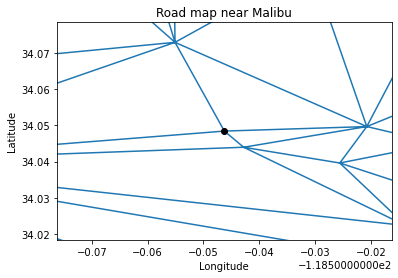

In [ ]:
plt.triplot(lon, lat, delaunay_out.simplices)
plt.ylim(lat_lon[malibu_node][0]-0.03,lat_lon[malibu_node][0]+0.03)
plt.xlim(lat_lon[malibu_node][1]-0.03,lat_lon[malibu_node][1]+0.03)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Road map near Malibu')
plt.plot(lon[malibu_node], lat[malibu_node],'o',color='black')
plt.savefig('Q16.png',dpi=500,bbox_inches='tight')
plt.show()

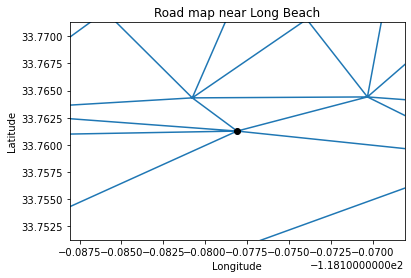

In [ ]:
plt.triplot(lon, lat, delaunay_out.simplices)
plt.ylim(lat_lon[long_beach_node][0]-0.01,lat_lon[long_beach_node][0]+0.01)
plt.xlim(lat_lon[long_beach_node][1]-0.01,lat_lon[long_beach_node][1]+0.01)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Road map near Long Beach')
plt.plot(lon[long_beach_node], lat[long_beach_node],'o',color='black')
plt.savefig('Q16b.png',dpi=500,bbox_inches='tight')
plt.show()

### Question 17

In [ ]:
g_del_prune=Graph()
g_del_prune.add_vertices(len(delaunay_out.points))
nodes=g_del_prune.vs()
i=0
for node in nodes:
    node['latitude']=lat[i]
    node['longitude']=lon[i]
#     node['coordinates'] = np.array([lon[i], lat[i]])
#     node['display_name'] = display_names[i]
    i+=1

threshold= 19/60

duplicate_remove=set()
edge_cut=set()
for i in range(len(delaunay_out.simplices)):
    a=((delaunay_out.simplices[i][0], delaunay_out.simplices[i][1]))
    b=((delaunay_out.simplices[i][0], delaunay_out.simplices[i][2]))
    c=((delaunay_out.simplices[i][1], delaunay_out.simplices[i][2]))
    list(a).sort()
    list(b).sort()
    list(c).sort()
    if not a in duplicate_remove:
        duplicate_remove.add(a)
        a_dist_check=np.sqrt((nodes[a[0]]['latitude']-nodes[a[1]]['latitude'])**2+(nodes[a[0]]['longitude']-nodes[a[1]]['longitude'])**2)
        if a_dist_check<threshold:
            g_del_prune.add_edges([a])
        else:
            edge_cut.add(a)
    if not b in duplicate_remove:
        duplicate_remove.add(b)
        b_dist_check=np.sqrt((nodes[b[0]]['latitude']-nodes[b[1]]['latitude'])**2+(nodes[b[0]]['longitude']-nodes[b[1]]['longitude'])**2)
        if b_dist_check<threshold:
            g_del_prune.add_edges([b])
        else:
            edge_cut.add(b)
    if not c in duplicate_remove:
        duplicate_remove.add(c)
        c_dist_check=np.sqrt((nodes[c[0]]['latitude']-nodes[c[1]]['latitude'])**2+(nodes[c[0]]['longitude']-nodes[c[1]]['longitude'])**2)
        if c_dist_check<threshold:
            g_del_prune.add_edges([c])
        else:
            edge_cut.add(c)
            
edge_cut_list=list(edge_cut)
simplices_list=[]
for simplex in delaunay_out.simplices:
    for edge in edge_cut_list:
        if edge[0] in simplex and edge[1] in simplex:
            simplices_list.append(list(simplex))
        
new_delaunay_out_desimplices = [i for i in delaunay_out.simplices if i not in np.array(simplices_list)]

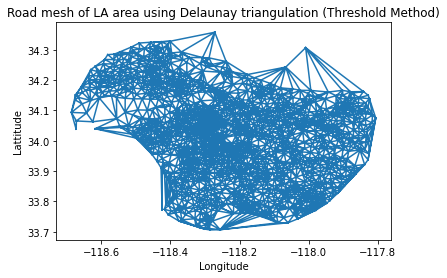

In [ ]:
plt.triplot(lon, lat, new_delaunay_out_desimplices)
plt.title('Road mesh of LA area using Delaunay triangulation (Threshold Method)')
plt.xlabel('Longitude')
plt.ylabel('Lattitude')
plt.savefig('Q17.png',dpi=500,bbox_inches='tight')
plt.show()

### Question 18

In [ ]:
print('Number of edge-disjoint paths: ',g_del_prune.adhesion(long_beach_node,malibu_node)-1)
print('Degree Distribution of nodes (Malibu, Long Beach): ', g_del_prune.degree(malibu_node,mode='out')-1,g_del_prune.degree(long_beach_node,mode='in')-1)

Number of edge-disjoint paths:  5
Degree Distribution of nodes (Malibu, Long Beach):  5 6


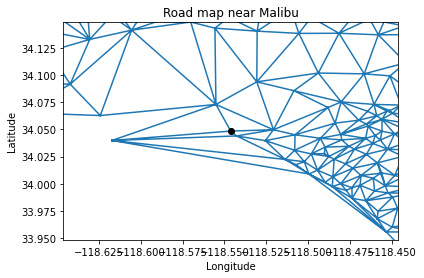

In [ ]:
plt.triplot(lon, lat, new_delaunay_out_desimplices)
plt.ylim(lat_lon[malibu_node][0]-0.1,lat_lon[malibu_node][0]+0.1)
plt.xlim(lat_lon[malibu_node][1]-0.1,lat_lon[malibu_node][1]+0.1)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Road map near Malibu')
plt.plot(lon[malibu_node], lat[malibu_node],'o',color='black')
plt.savefig('Q18.png',dpi=500,bbox_inches='tight')
plt.show()

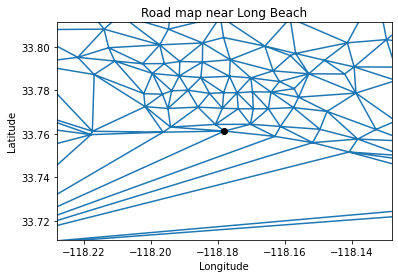

In [ ]:
plt.triplot(lon, lat, new_delaunay_out_desimplices)
plt.ylim(lat_lon[long_beach_node][0]-0.05,lat_lon[long_beach_node][0]+0.05)
plt.xlim(lat_lon[long_beach_node][1]-0.05,lat_lon[long_beach_node][1]+0.05)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Road map near Long Beach')
plt.plot(lon[long_beach_node], lat[long_beach_node],'o',color='black')
plt.savefig('Q18b.png',dpi=500,bbox_inches='tight')
plt.show()

### Construct new Roads

In [ ]:
g = deepcopy(copy_g)

In [ ]:
tri = Delaunay(g.vs['coordinates'])

In [ ]:
edges_to_induce = []

for i in range(tri.simplices.shape[0]):
    for col1, col2 in ((0, 1), (1, 2), (0, 2)):
        edges_to_induce += list(g.es.select(_between=([tri.simplices[i, col1]], [tri.simplices[i, col2]])))

In [ ]:
tri_g = g.subgraph_edges(edges_to_induce)

In [ ]:
#  Checker code for max flow
coordinates = np.array(tri_g.vs['coordinates'])
source_coordinates = [-118.5670548, 34.0458901]  # malibu
dest_coordinates = [-118.1819374, 33.759958]  # long beach

# source_idx = None
# dest_idx = None

# for i, coord in enumerate(coordinates):
#     if(coord[0] == source_coordinates[0] and  coord[1] == source_coordinates[1]):
#         source_idx = i
#     if(coord[0] == dest_coordinates[0] and  coord[1] == dest_coordinates[1]):
#         dest_idx = i

# Finding coordinates which are closest to the source and destination coordinates

source_min_dist = dest_min_dist = np.inf
source_idx = dest_idx = -1

for idx, v in enumerate(tri_g.vs):
    c = v['coordinates']
    
    source_dist = norm(c - source_coordinates)
    dest_dist = norm(c - dest_coordinates)
    
    if source_min_dist > source_dist:
        source_min_dist = source_dist
        source_idx = idx
    if dest_min_dist > dest_dist:
        dest_min_dist = dest_dist
        dest_idx = idx

In [ ]:
# source_min_dist = dest_min_dist = np.inf
# source_idx = dest_idx = -1

# for idx, v in enumerate(g.vs):
#     c = v['coordinates']
    
#     source_dist = LA.norm(c - source_coordinates)
#     dest_dist = LA.norm(c - dest_coordinates)
    
#     if source_min_dist > source_dist:
#         source_min_dist = source_dist
#         source_idx = idx
#     if dest_min_dist > dest_dist:
#         dest_min_dist = dest_dist
#         dest_idx = idx

In [ ]:
coordinates = np.array(tri_g.vs['coordinates'])
edge_ends = np.array([[edge.source, edge.target] for edge in tri_g.es])
sources, targets = edge_ends[:, 0], edge_ends[:, 1]
distances = norm(coordinates[sources, :] - coordinates[targets, :], axis = 1) * 69
speeds =  distances / np.array(tri_g.es['weight']) * 3600
car_length = 0.003  # (miles)
safety_distances = speeds * (2/3600)  # in miles, derived from 2 sec distance
cars_per_mile = 1 / (car_length + safety_distances)
n_lanes = 2
cars_per_hour = cars_per_mile * speeds * n_lanes

In [ ]:
tri_g.es['capacity'] = cars_per_hour

In [ ]:
trim_thresh = 800
edges_to_induce = tri_g.es.select(weight_le=trim_thresh)
tri_g_trimmed = tri_g.subgraph_edges(edges_to_induce)

In [ ]:
# #  Checker code for max flow

# source_coordinates = [-118.5670548, 34.0458901]  # malibu
# dest_coordinates = [-118.1819374, 33.759958]  # long beach

# source_idx = None
# dest_idx = None

# for i, coord in enumerate(coordinates):
#     if(np.round(coord[0], 1) == np.round(source_coordinates[0], 1) and  np.round(coord[1], 1) == np.round(source_coordinates[1], 1)):
#         source_idx = i
#     if(np.round(coord[0], 1) == np.round(dest_coordinates[0], 1) and  np.round(coord[1], 1) == np.round(dest_coordinates[1], 1)):
#         dest_idx = i
        

In [ ]:
print('Number of independent roads:', int(tri_g.maxflow_value(source_idx, dest_idx))) #max flow of graph (inbuilt is okay )
print('Number of cars per hour:', round(tri_g.maxflow_value(source_idx, dest_idx, capacity='capacity')))



Number of independent roads: 4
Number of cars per hour: 11074


In [ ]:
print('Number of independent roads:', int(tri_g_trimmed.maxflow_value(source_idx, dest_idx))) #max flow of graph (inbuilt is okay )
print('Number of cars per hour:', round(tri_g_trimmed.maxflow_value(source_idx, dest_idx, capacity='capacity')))



Number of independent roads: 4
Number of cars per hour: 11074


In [ ]:
# for e in g_del_prune.es():
#     src = e.source
#     target = e.target
    
#     edg = [src, target]
#     edg.sort()
#     key = str(edg[0]) + "-" + str(edg[1])
    
#     if(key in weight_dict):
#         e['weight'] = weight_dict[key]
#     else:
#         e['weight'] = copy_g.shortest_paths_dijkstra(source=edg[0], target=edg[1], weights=copy_g.es['weight'])[0][0]

#### Question 19: Strategy 1

In [ ]:
# For testing remove when Gdelta available

# nodes = np.arange(0, len(g.vs), 1)
# nodes = np.random.choice(nodes, 2600, replace=False)

In [ ]:
road_map = deepcopy(tri_g_trimmed)

## remove when Gdelta available
# road_map = road_map.induced_subgraph(nodes)

# comp = road_map.components()
# gc = max(comp, key=len)
# vdel = [i for i in range(len(road_map.vs)) if i not in gc]
# road_map.delete_vertices(vdel)
## remove when Gdelta available

len(road_map.vs), len(road_map.es)

(2647, 7756)

In [ ]:
edge_ends = np.array([[e.source, e.target] for e in road_map.es])
sources, targets = edge_ends[:, 0], edge_ends[:, 1]
distances = [norm(road_map.vs[e[0]]['coordinates'] - road_map.vs[e[1]]['coordinates']) * 69 for e in zip(sources, targets)]
road_map.es['geo_distance'] = distances
vcount = len(road_map.vs)
max(distances)

12.219177190168445

In [ ]:
shortest_path_distance = road_map.shortest_paths(road_map.vs, road_map.vs, weights=road_map.es['geo_distance'])
shortest_path_distance = np.array(shortest_path_distance)
shortest_path_distance.shape

(2647, 2647)

In [ ]:
actual_geo_distances = np.zeros((vcount,vcount))
for i in range(vcount):
    for j in range(vcount):
        actual_geo_distances[i, j] = norm(road_map.vs[i]['coordinates'] - road_map.vs[j]['coordinates']) * 69
differences = shortest_path_distance - actual_geo_distances

In [ ]:
ind = np.dstack(np.unravel_index(np.argsort(differences.ravel()), (differences.shape[0], differences.shape[1])))[0]

In [ ]:
new_static_edges = []
for i in range(40): #40 because there will be repititions (A-> B is same as B-> A)
    if i%2 ==0:
        continue
    idx = -(i + 1)
    newedge = ind[idx]
    print(road_map.vs[newedge[0]]['display_name'], "<-->", road_map.vs[newedge[1]]['display_name'], " Val: ",\
         differences[ind[idx][0], ind[idx][1]])
    new_static_edges.append(newedge)

Census Tract 800504 <--> Census Tract 670328  Val:  8.04668368349397
Census Tract 400501 <--> Census Tract 930200  Val:  8.015843892001008
Census Tract 800504 <--> Census Tract 670416  Val:  7.876229666514689
Census Tract 400404 <--> Census Tract 930200  Val:  7.823219582255824
Census Tract 400501 <--> Census Tract 930200  Val:  7.616785489248322
Census Tract 670328 <--> Census Tract 800504  Val:  7.513420238199064
Census Tract 401202 <--> Census Tract 930200  Val:  7.502282892246903
Census Tract 401202 <--> Census Tract 930200  Val:  7.459942787543071
Census Tract 400402 <--> Census Tract 930200  Val:  7.448615340679758
Census Tract 800504 <--> Census Tract 670416  Val:  7.355452157483278
Census Tract 404202 <--> Census Tract 930200  Val:  7.353725175907954
Census Tract 401001 <--> Census Tract 930200  Val:  7.317679781532959
Census Tract 401201 <--> Census Tract 930200  Val:  7.314557240915285
Census Tract 401312 <--> Census Tract 930200  Val:  7.279678715982648
Census Tract 404000 <

In [ ]:
#add the new_static_edges to our graph. 

road_map_static = deepcopy(tri_g_trimmed) #ensure to use deepcopy
for edg in new_static_edges:
    start = edg[0]
    end = edg[1]
    dist = actual_geo_distances[start, end]
    road_map_static.add_edge(start, end, geo_distance = dist)

In [ ]:
new_static_edges_dict = []

for e in new_static_edges:
    key = [e[0], e[1]]
    key.sort()
    key = str(key[0]) + '-' + str(key[1])
    new_static_edges_dict.append(key) 

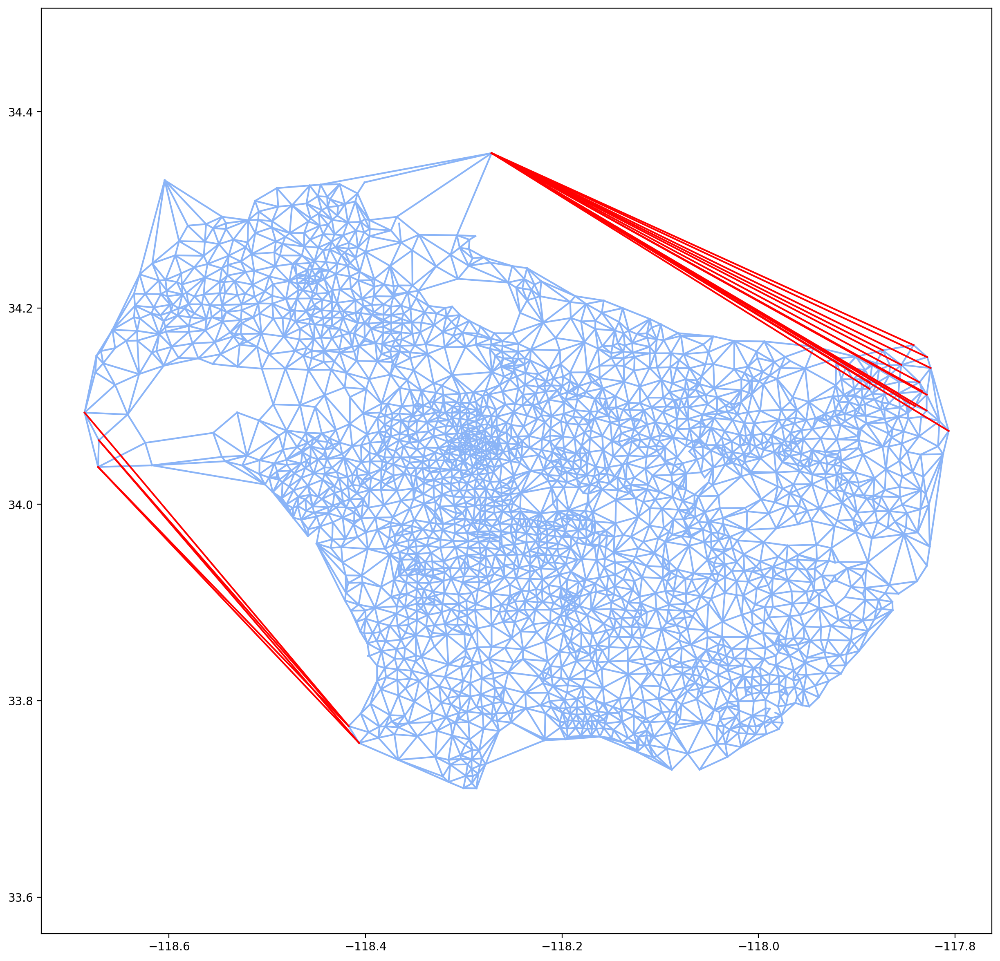

In [ ]:
# plot the roads and highlight our new edges. 
plt.figure(figsize=(15,15), dpi=200)
for e in road_map_static.es:
    start = e.source
    end = e.target
    cur_edge = sorted([start,end])

    v1 = road_map_static.vs[e.source]['coordinates']
    v2 = road_map_static.vs[e.target]['coordinates']
    data = np.vstack([v1, v2])
    x = data[:, 0]
    y = data[:, 1]
    key = str(start) + '-' + str(end)
    if key in new_static_edges_dict:
        plt.plot(x,y,'#FF0000') 
    else:
        plt.plot(x, y, '#8ab4f7')

plt.axis('equal')
plt.show()

In [ ]:
edge_ends = np.array([[e.source, e.target] for e in road_map.es])
sources, targets = edge_ends[:, 0], edge_ends[:, 1]
distances = []

for i, e in enumerate(road_map.es):
    miles = linalg.norm(road_map.vs[e.source]['coordinates'] - road_map.vs[e.target]['coordinates'])* 69
    distances.append(miles)

road_map.es['geo_distance'] = distances
vcount = len(road_map.vs)
print("Maximum distance in miles in LA: ", max(distances))


Maximum distance in miles in LA:  12.219177190168445


In [ ]:
shortest_distances = road_map.shortest_paths(road_map.vs, road_map.vs, weights=road_map.es['geo_distance'])
shortest_distances = np.array(shortest_distances)

In [ ]:
shortest_path_distance = {}

for i in range(vcount):
    for j in range(vcount):
        key1 = str(i) + "-" + str(j)
        key2 = str(j) + "-" + str(i)
        if((key1 in shortest_path_distance) or (key2 in shortest_path_distance)):
            continue
            
        shortest_path_distance[key1] = shortest_distances[i, j]

In [ ]:
actual_geo_distances = {}

for i in range(vcount):
    for j in range(vcount):
        key1 = str(i) + "-" + str(j)
        key2 = str(j) + "-" + str(i)
        
        euc = linalg.norm(road_map.vs[i]['coordinates'] - road_map.vs[j]['coordinates'])* 69
        
        if((key1 in actual_geo_distances) or (key2 in actual_geo_distances)):
            continue
        
        actual_geo_distances[key1] = euc

In [ ]:
differences = {}

for key in actual_geo_distances.keys():
    if(key not in shortest_path_distance):
        continue
    
    if(key in differences):
        continue
    
    differences[key] = shortest_path_distance[key] - actual_geo_distances[key]

In [ ]:
top20 = dict(sorted(differences.items(), key=lambda item: item[1], reverse=True))
values = list(top20.values())[0 : 20]
vertices = list(top20.keys())[0:20]
new_edges = np.array([x.split('-') for x in vertices]).astype('int')

In [ ]:
#add the new_static_edges to our graph. 

road_map_static = deepcopy(road_map) #ensure to use deepcopy
for i, edg in enumerate(new_edges):
    start = int(edg[0])
    end = int(edg[1])
    dist = actual_geo_distances[list(top20.keys())[i]]
    road_map_static.add_edge(start, end, geo_distance = dist)

In [ ]:
def printNewEdges(graph, newEdges):
    print("Top 20 edges added for strategy: \n")
    for i, edge in enumerate(newEdges):
        start = edge[0]
        end = edge[1]
        print(graph.vs[start]['display_name'] + "  <-->  " + graph.vs[end]['display_name'])

In [ ]:
printNewEdges(road_map_static, new_edges)

Top 20 edges added for strategy: 

Census Tract 670328  <-->  Census Tract 800504
Census Tract 400501  <-->  Census Tract 930200
Census Tract 670416  <-->  Census Tract 800504
Census Tract 400404  <-->  Census Tract 930200
Census Tract 400501  <-->  Census Tract 930200
Census Tract 800504  <-->  Census Tract 670328
Census Tract 401202  <-->  Census Tract 930200
Census Tract 401202  <-->  Census Tract 930200
Census Tract 400402  <-->  Census Tract 930200
Census Tract 800504  <-->  Census Tract 670416
Census Tract 404202  <-->  Census Tract 930200
Census Tract 401001  <-->  Census Tract 930200
Census Tract 401201  <-->  Census Tract 930200
Census Tract 401312  <-->  Census Tract 930200
Census Tract 404000  <-->  Census Tract 930200
Census Tract 670328  <-->  Census Tract 800202
Census Tract 403802  <-->  Census Tract 930200
Census Tract 403802  <-->  Census Tract 930200
Census Tract 401303  <-->  Census Tract 930200
Census Tract 401203  <-->  Census Tract 930200


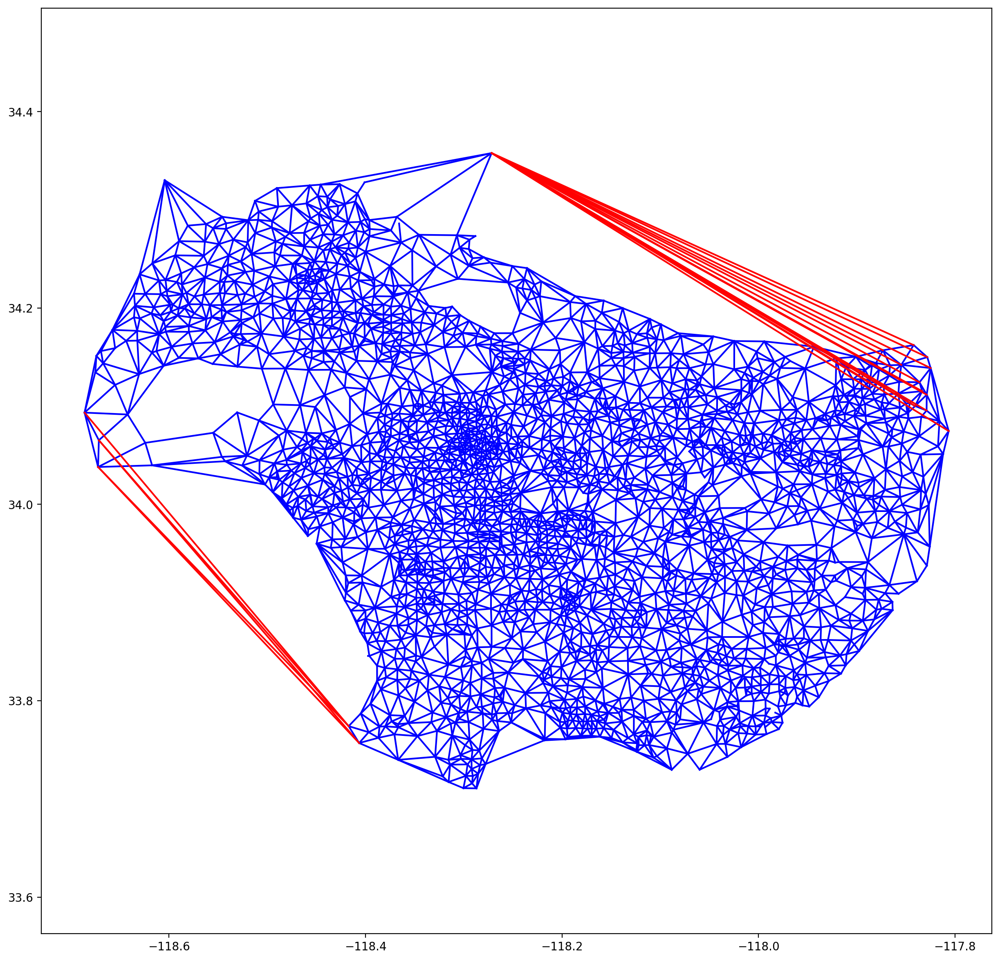

In [ ]:
# plot the roads and highlight our new edges. 
plt.figure(figsize=(15,15), dpi=200)
for e in road_map_static.es:
    start = e.source
    end = e.target
    cur_edge = sorted([start,end])
    key = str(cur_edge[0]) + "-" + str(cur_edge[1])

    v1 = road_map_static.vs[start]['coordinates']
    v2 = road_map_static.vs[end]['coordinates']
    data = np.vstack([v1, v2])
    x = data[:, 0]
    y = data[:, 1]
    if key in vertices:
        plt.plot(x, y, 'r') 
    else:
        plt.plot(x, y, 'b')

plt.axis('equal')
plt.show()

#### Strategy 2

In [ ]:
np.random.seed(2022)

frequencies = np.random.randint(1,1001, len(differences))
frequencies.shape

(3504628,)

In [ ]:
difference_frequency = {}
for i, key in enumerate(differences.keys()):
    difference_frequency[key] = differences[key] * frequencies[i]

In [ ]:
top20 = dict(sorted(difference_frequency.items(), key=lambda item: item[1], reverse=True))
values = list(top20.values())[0 : 20]
vertices = list(top20.keys())[0:20]
new_edges = np.array([x.split('-') for x in vertices]).astype('int')

In [ ]:
#add the new_static_edges to our graph. 

road_map_static = deepcopy(road_map) #ensure to use deepcopy
for i, edg in enumerate(new_edges):
    start = int(edg[0])
    end = int(edg[1])
    dist = actual_geo_distances[list(top20.keys())[i]]
    road_map_static.add_edge(start, end, geo_distance = dist)

In [ ]:
printNewEdges(road_map_static, new_edges)

Top 20 edges added for strategy: 

Census Tract 404201  <-->  Census Tract 930200
Census Tract 402403  <-->  Census Tract 930200
Census Tract 403802  <-->  Census Tract 930200
Census Tract 400501  <-->  Census Tract 930200
Census Tract 404201  <-->  Census Tract 930200
Census Tract 403901  <-->  Census Tract 930200
Census Tract 403323  <-->  Census Tract 930200
Census Tract 403312  <-->  Census Tract 930200
Census Tract 405701  <-->  Census Tract 930200
Census Tract 800203  <-->  Census Tract 670416
Census Tract 401002  <-->  Census Tract 930200
Census Tract 403703  <-->  Census Tract 930200
Census Tract 405600  <-->  Census Tract 930200
Census Tract 137504  <-->  Census Tract 262601
Census Tract 401201  <-->  Census Tract 930200
Census Tract 134002  <-->  Census Tract 262601
Census Tract 800504  <-->  Census Tract 670413
Census Tract 404100  <-->  Census Tract 930200
Census Tract 403703  <-->  Census Tract 930200
Census Tract 930200  <-->  Census Tract 001505


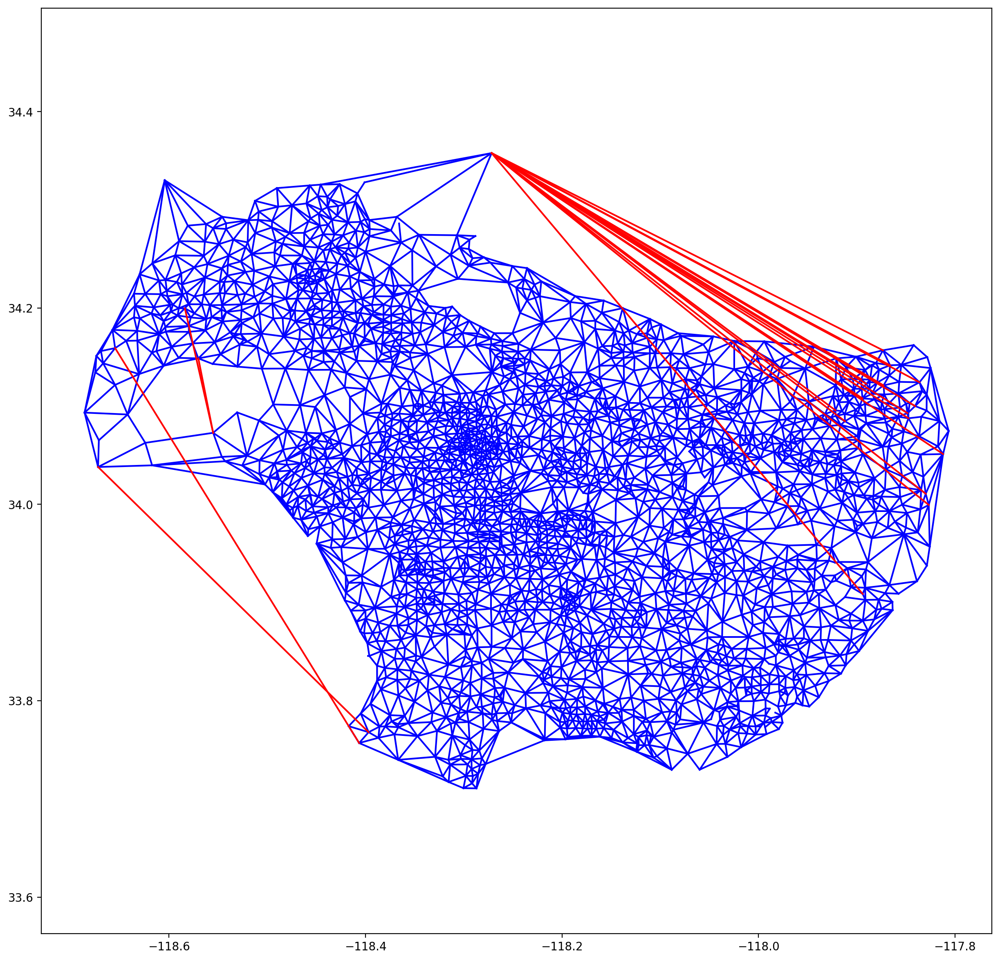

In [ ]:
# plot the roads and highlight our new edges. 
count = 0
plt.figure(figsize=(15,15), dpi=200)
for e in road_map_static.es:
    start = e.source
    end = e.target
    cur_edge = sorted([start,end])
    key = str(cur_edge[0]) + "-" + str(cur_edge[1])

    v1 = road_map_static.vs[e.source]['coordinates']
    v2 = road_map_static.vs[e.target]['coordinates']
    data = np.vstack([v1, v2])
    x = data[:, 0]
    y = data[:, 1]
    if key in vertices:
        count+=1
        plt.plot(x,y, 'r') 
    else:
        plt.plot(x, y, 'b')

plt.axis('equal')
plt.show()

#### Strategy 3

In [ ]:
road_map_dynamic = deepcopy(road_map)

In [ ]:
budget = 20
new_dynamic_edges = []
print("New edges based on strategy 3:")
for i in range(budget):
    
    shortest_distances = road_map_dynamic.shortest_paths(road_map_dynamic.vs, road_map_dynamic.vs, weights=road_map_dynamic.es['geo_distance'])
    shortest_distances = np.array(shortest_distances)
    
    shortest_path_distance = {}

    for i in range(vcount):
        for j in range(vcount):
            key1 = str(i) + "-" + str(j)
            key2 = str(j) + "-" + str(i)
            if((key1 in shortest_path_distance) or (key2 in shortest_path_distance)):
                continue

            shortest_path_distance[key1] = shortest_distances[i, j]

    differences = {}

    for key in actual_geo_distances.keys():
        if(key not in shortest_path_distance):
            continue

        if(key in differences):
            continue

        differences[key] = shortest_path_distance[key] - actual_geo_distances[key]
        
    top20 = dict(sorted(differences.items(), key=lambda item: item[1], reverse=True))
    values = list(top20.values())[0]
    vertices = list(top20.keys())[0]
    new_edge = np.array(vertices.split('-')).astype('int')
    
    print(road_map_dynamic.vs[new_edge[0]]['display_name'] + "  <-->  " + road_map_dynamic.vs[new_edge[1]]['display_name'])
    new_dynamic_edges.append(list(top20.keys())[0])
    start = int(new_edge[0])
    end = int(new_edge[1])
    new_distance = actual_geo_distances[list(top20.keys())[0]]
    road_map_dynamic.add_edge(start, end, weight = -1, geo_distance = new_distance)
    

New edges based on strategy 3:
Census Tract 670328  <-->  Census Tract 800504
Census Tract 400501  <-->  Census Tract 930200
Census Tract 137501  <-->  Census Tract 262601
Census Tract 404301  <-->  Census Tract 930200
Census Tract 430003  <-->  Census Tract 930200
Census Tract 430301  <-->  Census Tract 930200
Census Tract 670328  <-->  Census Tract 800506
Census Tract 430501  <-->  Census Tract 930200
Census Tract 461200  <-->  Census Tract 930200
Census Tract 139802  <-->  Census Tract 980019
Census Tract 800203  <-->  Census Tract 088105
Census Tract 310201  <-->  Census Tract 101300
Census Tract 460301  <-->  Census Tract 930200
Census Tract 800504  <-->  Census Tract 670324
Census Tract 800101  <-->  Census Tract 088105
Census Tract 621204  <-->  Census Tract 800504
Census Tract 800101  <-->  Census Tract 651302
Census Tract 800506  <-->  Census Tract 670326
Census Tract 301400  <-->  Census Tract 980020
Census Tract 800203  <-->  Census Tract 110003


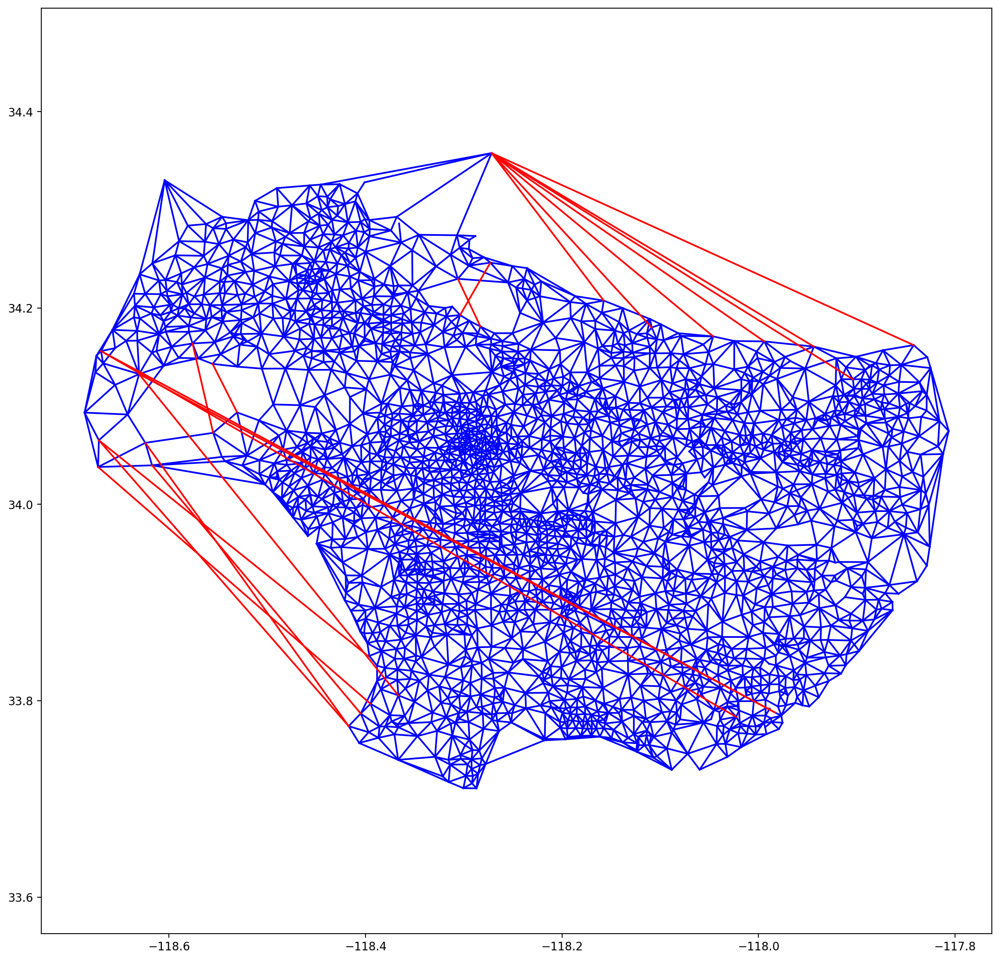

In [ ]:
# plot the roads
plt.figure(figsize=(15,15), dpi=200)
for e in road_map_dynamic.es:
    start = e.source
    end = e.target
    cur_edge = sorted([start,end])
    
    key = str(cur_edge[0]) + "-" + str(cur_edge[1])
    v1 = road_map_dynamic.vs[start]['coordinates']
    v2 = road_map_dynamic.vs[end]['coordinates']
    data = np.vstack([v1, v2])
    x = data[:, 0]
    y = data[:, 1]
    if key in new_dynamic_edges:
        plt.plot(x,y,'r')
    else:
        plt.plot(x, y, 'b' )

plt.axis('equal')
plt.show()

#### Strategy 4

In [ ]:
road_map_static = deepcopy(road_map)

In [ ]:
travel_times = road_map_static.shortest_paths(road_map_static.vs, road_map_static.vs,
                                              weights=road_map_static.es['weight'])
travel_times = np.array(travel_times)


In [ ]:
# Dictionary of paths

shortest_path_times = {}

for i in range(vcount):
    for j in range(vcount):
        key1 = str(i) + "-" + str(j)
        key2 = str(j) + "-" + str(i)
        if((key1 in shortest_path_times) or (key2 in shortest_path_times)):
            continue
            
        shortest_path_times[key1] = travel_times[i, j]

In [ ]:
shortest_distances = road_map_static.shortest_paths(road_map_static.vs, road_map_static.vs,
                                                    weights=road_map_static.es['geo_distance'])
shortest_distances = np.array(shortest_distances)

In [ ]:
travel_speeds = np.zeros((vcount, vcount))

In [ ]:
for i in range(vcount):
    for j in range(vcount):
        if(i == j):
            continue
        travel_speeds[i, j] = shortest_distances[i, j] / travel_times[i, j]

In [ ]:
travel_speeds_dict = {}

for i in range(vcount):
    for j in range(vcount):
        key1 = str(i) + "-" + str(j)
        key2 = str(j) + "-" + str(i)
        if((key1 in travel_speeds_dict) or (key2 in travel_speeds_dict)):
            continue
            
        travel_speeds_dict[key1] = travel_speeds[i, j]

In [ ]:
euclidean_time = {}
for i, key in enumerate(actual_geo_distances.keys()):
    if(travel_speeds_dict[key] > 0):
        euclidean_time[key] = actual_geo_distances[key] / travel_speeds_dict[key]
    else:
        euclidean_time[key] = 0

In [ ]:
extra_times_dict = {}

for key in shortest_path_times.keys():
    extra_times_dict[key] = shortest_path_times[key] - euclidean_time[key]


In [ ]:
top20 = dict(sorted(extra_times_dict.items(), key=lambda item: item[1], reverse=True))
values = list(top20.values())[0 : 20]
vertices = list(top20.keys())[0:20]
new_edges = np.array([x.split('-') for x in vertices]).astype('int')

In [ ]:
road_map_static = deepcopy(road_map) #ensure to use deepcopy
for i, edg in enumerate(new_edges):
    start = int(edg[0])
    end = int(edg[1])
    dist = actual_geo_distances[list(top20.keys())[i]]
    time = euclidean_time[list(top20.keys())[i]]
    road_map_static.add_edge(start, end, geo_distance = dist, weight = time)

In [ ]:
printNewEdges(road_map_static, new_edges)

Top 20 edges added for strategy: 

Census Tract 670328  <-->  Census Tract 800504
Census Tract 670416  <-->  Census Tract 800504
Census Tract 670328  <-->  Census Tract 800202
Census Tract 670413  <-->  Census Tract 800504
Census Tract 670416  <-->  Census Tract 800202
Census Tract 800504  <-->  Census Tract 670328
Census Tract 800504  <-->  Census Tract 670416
Census Tract 137402  <-->  Census Tract 980019
Census Tract 137504  <-->  Census Tract 262601
Census Tract 670326  <-->  Census Tract 800504
Census Tract 138000  <-->  Census Tract 262601
Census Tract 800101  <-->  Census Tract 670328
Census Tract 800101  <-->  Census Tract 670416
Census Tract 800203  <-->  Census Tract 670328
Census Tract 134001  <-->  Census Tract 262601
Census Tract 138000  <-->  Census Tract 980019
Census Tract 670406  <-->  Census Tract 800504
Census Tract 800203  <-->  Census Tract 670416
Census Tract 134002  <-->  Census Tract 262601
Census Tract 137401  <-->  Census Tract 980019


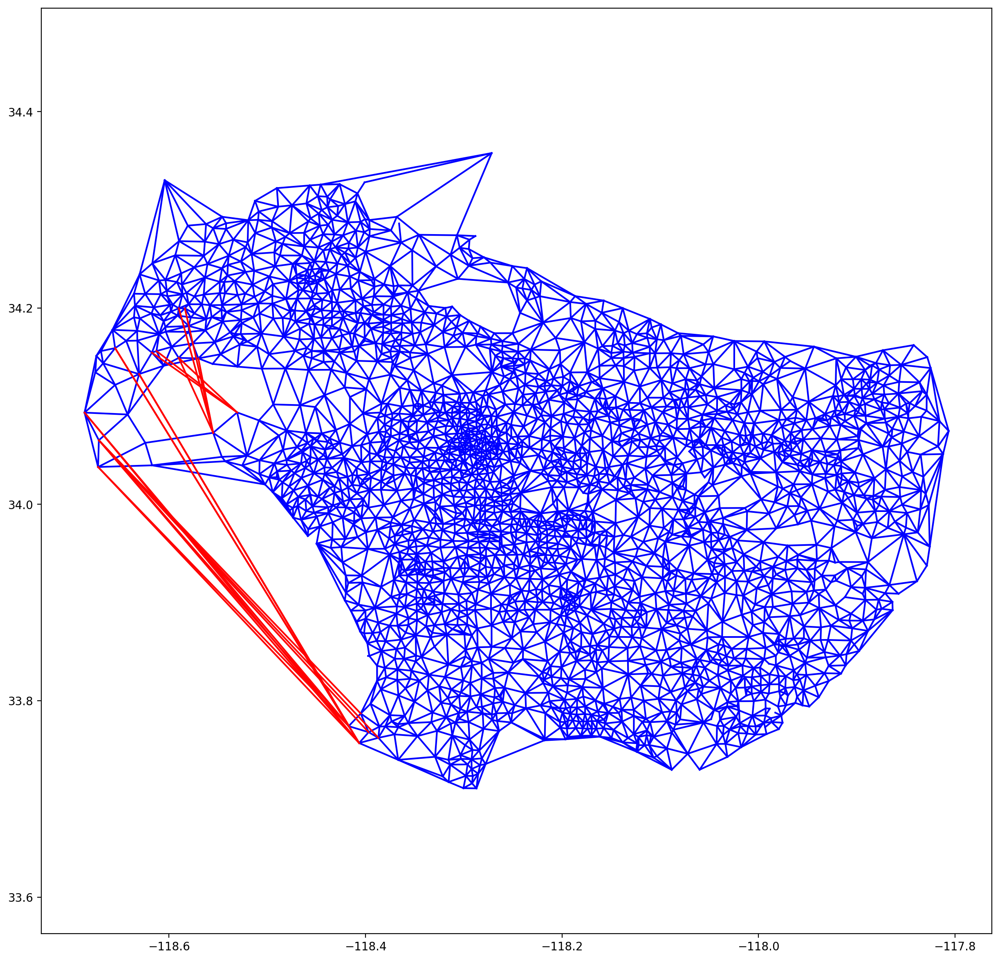

In [ ]:
# plot the roads
plt.figure(figsize=(15,15), dpi=200)
for e in road_map_static.es:
    start = e.source
    end = e.target
    cur_edge = sorted([start,end])
    
    key = str(cur_edge[0]) + "-" + str(cur_edge[1])
    v1 = road_map_static.vs[start]['coordinates']
    v2 = road_map_static.vs[end]['coordinates']
    data = np.vstack([v1, v2])
    x = data[:, 0]
    y = data[:, 1]
    if key in vertices:
        plt.plot(x, y,'r')
    else:
        plt.plot(x, y, 'b' )

plt.axis('equal')
plt.show()

#### Strategy 5

In [ ]:
road_map_dynamic = deepcopy(road_map)

In [ ]:
budget = 20
new_dynamic_edges = []
print("New edges based on strategy 5:")
for k in range(budget):
    travel_times = road_map_dynamic.shortest_paths(road_map_dynamic.vs, road_map_dynamic.vs,
                                              weights=road_map_dynamic.es['weight'])
    travel_times = np.array(travel_times)

    shortest_path_times = {}

    for i in range(vcount):
        for j in range(vcount):
            key1 = str(i) + "-" + str(j)
            key2 = str(j) + "-" + str(i)
            if((key1 in shortest_path_times) or (key2 in shortest_path_times)):
                continue

            shortest_path_times[key1] = travel_times[i, j]

            
    shortest_distances = road_map_dynamic.shortest_paths(road_map_dynamic.vs, road_map_dynamic.vs,
                                                    weights=road_map_dynamic.es['geo_distance'])
    shortest_distances = np.array(shortest_distances)
    
    travel_speeds = np.zeros((vcount, vcount))
    
    for i in range(vcount):
        for j in range(vcount):
            if(i == j):
                continue
            travel_speeds[i, j] = shortest_distances[i, j] / travel_times[i, j]
    
    
    travel_speeds_dict = {}

    for i in range(vcount):
        for j in range(vcount):
            key1 = str(i) + "-" + str(j)
            key2 = str(j) + "-" + str(i)
            if((key1 in travel_speeds_dict) or (key2 in travel_speeds_dict)):
                continue

            travel_speeds_dict[key1] = travel_speeds[i, j]
            
    euclidean_time = {}
    for i, key in enumerate(actual_geo_distances.keys()):
        if(travel_speeds_dict[key] > 0):
            euclidean_time[key] = actual_geo_distances[key] / travel_speeds_dict[key]
        else:
            euclidean_time[key] = 0
            
    extra_times_dict = {}

    for key in shortest_path_times.keys():
        extra_times_dict[key] = shortest_path_times[key] - euclidean_time[key]

    top20 = dict(sorted(extra_times_dict.items(), key=lambda item: item[1], reverse=True))
    values = list(top20.values())[0]
    vertices = list(top20.keys())[0]
    new_edge = np.array(vertices.split('-')).astype('int')
    
    print(road_map_dynamic.vs[new_edge[0]]['display_name'] + "  <-->  " + road_map_dynamic.vs[new_edge[1]]['display_name'])
    new_dynamic_edges.append(list(top20.keys())[0])
    start = int(new_edge[0])
    end = int(new_edge[1])
    new_time = euclidean_time[list(top20.keys())[0]]
    new_distance = linalg.norm(road_map_dynamic.vs[start]['coordinates'] - road_map_dynamic.vs[end]['coordinates'])* 69
    road_map_dynamic.add_edge(start, end, weight = new_time, geo_distance = new_distance)
    

New edges based on strategy 5:
Census Tract 670328  <-->  Census Tract 800504
Census Tract 137402  <-->  Census Tract 980019
Census Tract 137504  <-->  Census Tract 262601
Census Tract 400501  <-->  Census Tract 930200
Census Tract 670328  <-->  Census Tract 800506
Census Tract 408005  <-->  Census Tract 930200
Census Tract 404301  <-->  Census Tract 930200
Census Tract 430003  <-->  Census Tract 930200
Census Tract 500100  <-->  Census Tract 930200
Census Tract 501600  <-->  Census Tract 930200
Census Tract 430301  <-->  Census Tract 930200
Census Tract 621204  <-->  Census Tract 800504
Census Tract 139703  <-->  Census Tract 980019
Census Tract 433401  <-->  Census Tract 930200
Census Tract 430501  <-->  Census Tract 930200
Census Tract 800506  <-->  Census Tract 670326
Census Tract 310100  <-->  Census Tract 101210
Census Tract 461200  <-->  Census Tract 930200
Census Tract 310201  <-->  Census Tract 980020
Census Tract 800101  <-->  Census Tract 621326


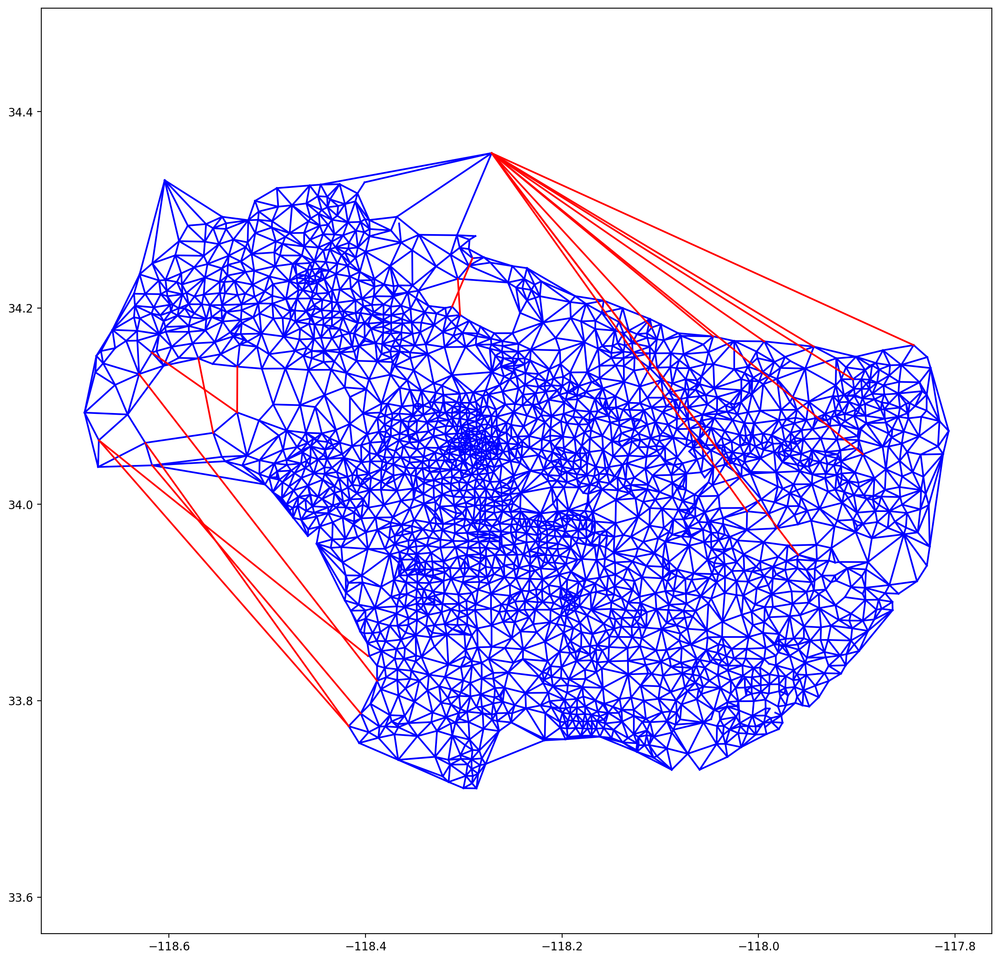

In [ ]:
# plot the roads
plt.figure(figsize=(15,15), dpi=200)
for e in road_map_dynamic.es:
    start = e.source
    end = e.target
    cur_edge = sorted([start,end])
    
    key = str(cur_edge[0]) + "-" + str(cur_edge[1])
    v1 = road_map_dynamic.vs[start]['coordinates']
    v2 = road_map_dynamic.vs[end]['coordinates']
    data = np.vstack([v1, v2])
    x = data[:, 0]
    y = data[:, 1]
    if key in new_dynamic_edges:
        plt.plot(x, y, 'r')
    else:
        plt.plot(x, y, 'b')

plt.axis('equal')
plt.show()

#### Custom Strategy

In [ ]:
road_map_dynamic = deepcopy(road_map)

In [ ]:
def equationOfLine(P, Q):
    a = Q[1] - P[1]
    b = P[0] - Q[0]
    c = a*(P[0]) + b*(P[1])
    
    return a, b, c

def shortestDist(P, a, b, c):
    num = np.abs(a*P[0] + b*P[1] + c)
    den = norm([a, b])
    
    return num/den

In [ ]:
budget = 20
new_dynamic_edges = []
min_locations = 20
max_distance = 5 #5 miles
print("New edges based on custom strategy:")
for i in range(budget):
    shortest_distances = road_map_dynamic.shortest_paths(road_map_dynamic.vs, road_map_dynamic.vs, weights=road_map_dynamic.es['geo_distance'])
    shortest_distances = np.array(shortest_distances)
    
    shortest_path_distance = {}

    for i in range(vcount):
        for j in range(vcount):
            key1 = str(i) + "-" + str(j)
            key2 = str(j) + "-" + str(i)
            if((key1 in shortest_path_distance) or (key2 in shortest_path_distance)):
                continue

            shortest_path_distance[key1] = shortest_distances[i, j]

    differences = {}

    for key in actual_geo_distances.keys():
        if(key not in shortest_path_distance):
            continue

        if(key in differences):
            continue

        differences[key] = shortest_path_distance[key] - actual_geo_distances[key]
        
    top20 = dict(sorted(differences.items(), key=lambda item: item[1], reverse=True))
    
    new_edge = []
    coor_keys = list(top20.keys())
    values = list(top20.values())
    for j, val in enumerate(values):
        vertices = coor_keys[j]
        edge = np.array(vertices.split('-')).astype('int')
        P = road_map_dynamic.vs[edge[0]]['coordinates']
        Q = road_map_dynamic.vs[edge[1]]['coordinates']
        
        a, b, c = equationOfLine(P, Q)
        
        vertices = road_map_dynamic.vs['coordinates']
        
        count = -2
        for ver in vertices:
            if(shortestDist(ver, a, b, c) <= max_distance):
                count+=1
            if(count >= min_locations):
                new_edge = edge
                break
        if len(new_edge):
            break
    
    new_dynamic_edges.append(new_edge)
        
    
    print(road_map_dynamic.vs[new_edge[0]]['display_name'] + "  <-->  " + road_map_dynamic.vs[new_edge[1]]['display_name'], " Val: ", values[j])
    start = int(new_edge[0])
    end = int(new_edge[1])
    new_distance = actual_geo_distances[coor_keys[j]]
    road_map_dynamic.add_edge(start, end, weight = -1, geo_distance = new_distance)
    

New edges based on custom strategy:
Census Tract 800504  <-->  Census Tract 087200  Val:  3.9270284616819424
Census Tract 800504  <-->  Census Tract 110606  Val:  3.839036938614761
Census Tract 800202  <-->  Census Tract 001503  Val:  3.7693051830312143
Census Tract 800102  <-->  Census Tract 001707  Val:  3.463436239922764
Census Tract 554511  <-->  Census Tract 800504  Val:  3.4549865591753246
Census Tract 800203  <-->  Census Tract 021815  Val:  3.4333814896047414
Census Tract 106111  <-->  Census Tract 400501  Val:  3.3496950893943094
Census Tract 800102  <-->  Census Tract 503702  Val:  3.340762175606187
Census Tract 534102  <-->  Census Tract 800102  Val:  3.3224037506371644
Census Tract 533601  <-->  Census Tract 800102  Val:  3.318860985045866
Census Tract 554700  <-->  Census Tract 800504  Val:  3.2950551912610635
Census Tract 552100  <-->  Census Tract 800504  Val:  3.1797127982789632
Census Tract 800202  <-->  Census Tract 532400  Val:  3.1588713245015754
Census Tract 800203

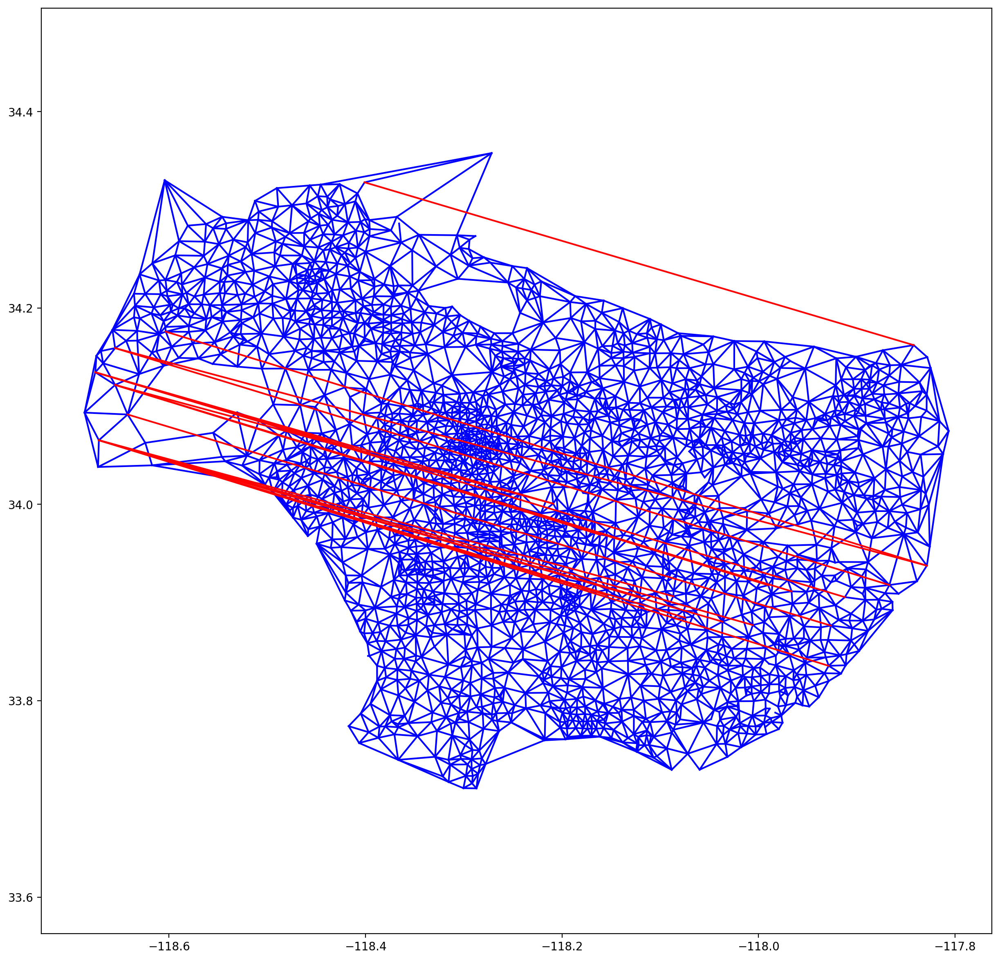

In [ ]:
# plot the roads
plt.figure(figsize=(15,15), dpi=200)

new_edges_dict = []
for e in new_dynamic_edges:
    key = str(e[0]) + "-" + str(e[1])
    new_edges_dict.append(key)
    
for e in road_map_dynamic.es:
    start = e.source
    end = e.target
    cur_edge = sorted([start,end])
    
    key = str(cur_edge[0]) + "-" + str(cur_edge[1])
    v1 = road_map_dynamic.vs[start]['coordinates']
    v2 = road_map_dynamic.vs[end]['coordinates']
    data = np.vstack([v1, v2])
    x = data[:, 0]
    y = data[:, 1]
    if key in new_edges_dict:
        plt.plot(x, y, 'r')
    else:
        plt.plot(x, y, 'b')

plt.axis('equal')
plt.show()